<a href="https://colab.research.google.com/github/Mai-Testing/Mai/blob/main/Image_denoise_U_net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Denoising Image Using U-Net**

# initialization

In [ ]:
from google.colab import drive, files
import matplotlib.pyplot as plt
import cv2
import numpy as np
import tensorflow as tf
import os
import datetime
from keras import layers
from tensorflow import keras
from keras.models import Model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvidia-smi
tf.config.list_physical_devices('GPU')

Tue Jun 20 00:01:15 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
defaults = dict(
        image_dir="/content/drive/MyDrive/SummerHS-project/Noisy",
        label_dir="/content/drive/MyDrive/SummerHS-project/NoiseFree",
        image_size=(256,256),
        batch_size=16,
        num_classes = 1)

# Generate Dataset

In [ ]:
train_data, val_data = tf.keras.utils.image_dataset_from_directory(
    defaults["image_dir"],
    label_mode = None,
    image_size=defaults["image_size"],
    batch_size=defaults["batch_size"],
    shuffle=False,
    validation_split=0.2,
    subset="both",
    color_mode='grayscale')

train_labels, val_labels = tf.keras.utils.image_dataset_from_directory(
    defaults["label_dir"],
    label_mode=None,
    image_size=defaults["image_size"],
    batch_size=defaults["batch_size"],
    shuffle=False,
    validation_split=0.2,
    subset="both",
    color_mode='grayscale')

# zipping
train_ds = tf.data.Dataset.zip((train_data, train_labels))
val_ds = tf.data.Dataset.zip((val_data, val_labels))


Found 2000 files belonging to 1 classes.
Using 1600 files for training.
Using 400 files for validation.
Found 2000 files belonging to 1 classes.
Using 1600 files for training.
Using 400 files for validation.


In [ ]:
data_rescale = tf.keras.Sequential(
    [
        tf.keras.layers.Rescaling(scale=1./255.),
    ]
)

In [ ]:
train_ds = train_ds.shuffle(5000)

# Rescale dataset
train_ds = train_ds.map(
    lambda img, label: (data_rescale(img), data_rescale(label)),
    num_parallel_calls=tf.data.AUTOTUNE,
)

val_ds = val_ds.map(
    lambda img, label: (data_rescale(img), data_rescale(label)),
    num_parallel_calls=tf.data.AUTOTUNE,
)
# Prefetching samples in GPU memory helps maximize GPU utilization.
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)


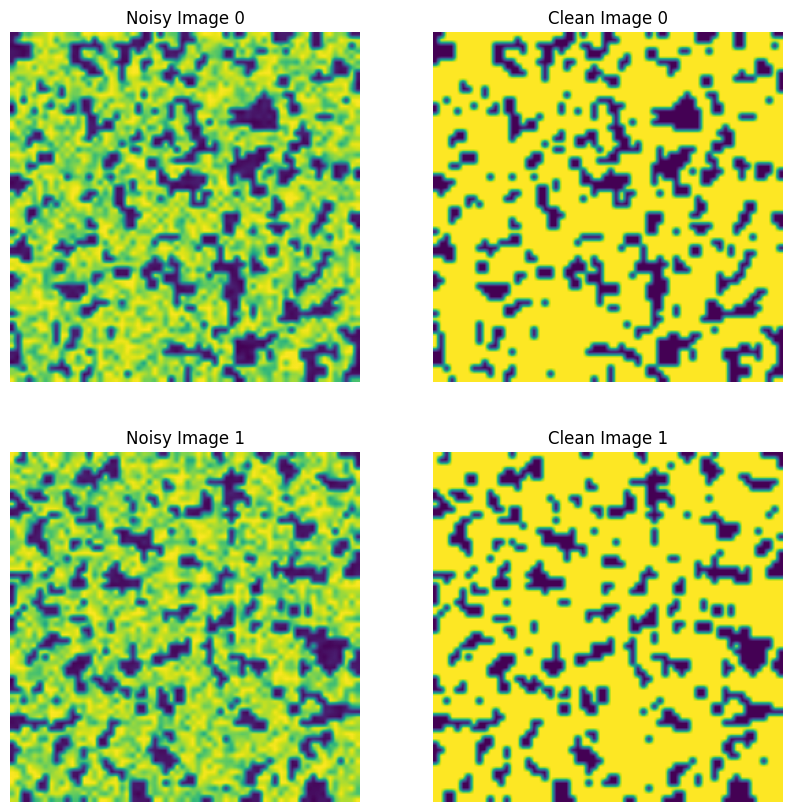

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(0,3,2):
        ax = plt.subplot(2, 2, i+1)
        I = images[i]
        plt.imshow(images[i])
        plt.title("Noisy Image " + str(int(i/2)))
        plt.axis("off")
        ax = plt.subplot(2, 2, i+2)
        plt.imshow(labels[i])
        plt.title("Clean Image " + str(int(i/2)))
        plt.axis("off")

# Create U-Net Model

In [ ]:
def double_conv_block(x, n_filters):

   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu")(x)
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu")(x)

   return x

In [ ]:
def downsample_block(x, n_filters):
   f = double_conv_block(x, n_filters)
   p = layers.MaxPool2D(2)(f)
   p = layers.Dropout(0.2)(p)

   return f, p

In [ ]:
def upsample_block(x, conv_features, n_filters):
   # upsample
   x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
   # concatenate
   x = layers.concatenate([x, conv_features])
   # dropout
   x = layers.Dropout(0.2)(x)
   # Conv2D twice with ReLU activation
   x = double_conv_block(x, n_filters)

   return x

In [ ]:
def build_unet_model():
 # inputs
   inputs = layers.Input(shape=(256,256,1))
   channels = 32
   # encoder: contracting path - downsample
   # 1 - downsample
   f1, p1 = downsample_block(inputs, channels)
   # 2 - downsample
   f2, p2 = downsample_block(p1, channels*2)
   # 3 - downsample
   f3, p3 = downsample_block(p2, channels*4)
   # 4 - downsample
   f4, p4 = downsample_block(p3, channels*8)

   # 5 - bottleneck
   bottleneck = double_conv_block(p4, 512)

   # decoder: expanding path - upsample
   # 6 - upsample
   u6 = upsample_block(bottleneck, f4, channels*8)
   # 7 - upsample
   u7 = upsample_block(u6, f3, channels*4)
   # 8 - upsample
   u8 = upsample_block(u7, f2, channels*2)
   # 9 - upsample
   u9 = upsample_block(u8, f1, channels)

   # outputs
   outputs = layers.Conv2D(1, 1, padding="same", activation = "relu")(u9)

   # unet model with Keras Functional API
   unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

   return unet_model

In [ ]:
unet_model = build_unet_model()

In [ ]:
unet_model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 32  9248        ['conv2d[0][0]']                 
                                )                                                             

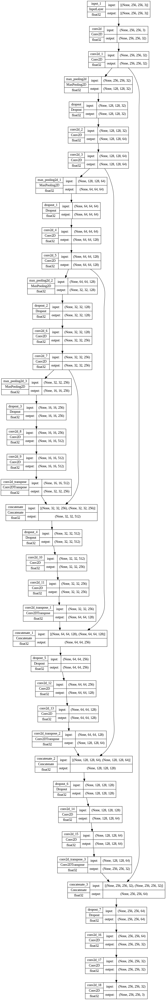

In [ ]:
tf.keras.utils.plot_model(unet_model,show_shapes=True,show_dtype=True)

# Training Model

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Clear any logs from previous runs
!rm -rf content/logs/

In [ ]:
unet_model.compile(optimizer=tf.keras.optimizers.AdamW(),
                  loss=tf.keras.losses.mse,
                  )

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
model_history = unet_model.fit(train_ds,
                              epochs=25,
                              validation_data=val_ds,
                              batch_size=16,
                              callbacks=[tensorboard_callback])

Epoch 1/25
100/100 [==============================] - 104s 729ms/step - loss: 0.2123 - val_loss: 0.0051
Epoch 2/25
100/100 [==============================] - 44s 416ms/step - loss: 0.0055 - val_loss: 0.0028
Epoch 3/25
100/100 [==============================] - 44s 422ms/step - loss: 0.0032 - val_loss: 0.0013
Epoch 4/25
100/100 [==============================] - 45s 425ms/step - loss: 0.0022 - val_loss: 9.7386e-04
Epoch 5/25
100/100 [==============================] - 45s 426ms/step - loss: 0.0017 - val_loss: 6.9238e-04
Epoch 6/25
100/100 [==============================] - 45s 431ms/step - loss: 0.0013 - val_loss: 7.6844e-04
Epoch 7/25
100/100 [==============================] - 45s 429ms/step - loss: 0.0011 - val_loss: 2.8274e-04
Epoch 8/25
100/100 [==============================] - 45s 429ms/step - loss: 9.3257e-04 - val_loss: 3.5471e-04
Epoch 9/25
100/100 [==============================] - 45s 432ms/step - loss: 7.8397e-04 - val_loss: 1.9318e-04
Epoch 10/25
100/100 [===================

In [ ]:
unet_model.save('u-net_denoise.h5')

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
result = unet_model.predict(val_ds)

25/25 [==============================] - 2s 84ms/step


# Predict output

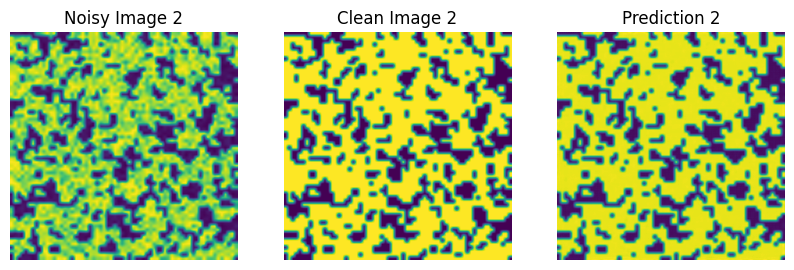

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in val_ds.take(1):
    for i in range(1):
        index = 2
        ax = plt.subplot(1, 3, i+1)
        I = images[index]
        plt.imshow(images[index])
        plt.title("Noisy Image " + str(int(index)))
        plt.axis("off")
        ax = plt.subplot(1, 3, i+2)
        plt.imshow(labels[index])
        plt.title("Clean Image " + str(int(index)))
        plt.axis("off")
        ax = plt.subplot(1, 3, i+3)
        plt.imshow(result[index])
        plt.title("Prediction " + str(int(index)))
        plt.axis("off")
